In [84]:
import subprocess
import os
import re
import pandas as pd
def runCache(params):
    # nbr_block,  strategy,  block_size,  vec_size,  mat_bloc_prop
    commande = './cache ' + str(params['nbr_block']) + ' ' + str(params['strategy']) + ' ' + \
            str(params['block_size'])+ ' '+ str(params['vec_size']) + ' '+ str(params['mat_bloc_prop'])
    print(commande) 
    result = subprocess.Popen(commande,shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    stdout,stderr = result.communicate()
    print(stderr.decode('UTF-8'))
    #print(stdout.decode('UTF-8'))
    lines = stdout.decode('UTF-8').splitlines()
    results=[];
    count = 0
    test_type = ["vec_vec","vec_mat", "mat_mat"];
    for l in lines:
        temp = {}
        #print(l)
        if(l.find("current cache cache size")>=0):
            #print(l)
            l = l.split("current cache cache size ",1)[1]
            temp["nbr_block"] = int(l.split(" strategy ",1)[0])
            l = l.split(" strategy ",1)[1]
            temp["strategy"] = int(l.split(" hits ",1)[0])
            l = l.split(" hits ",1)[1]
            temp["hits"] = int(l.split(" misses ",1)[0])
            l = l.split(" misses ",1)[1]
            temp["misses"] = int(l.split(" hits-ratio ",1)[0])
            l = l.split(" hits-ratio ",1)[1]
            temp["hits-ratio"] = float(l.split(" %  ",1)[0])
            l = l.split("Mean acces time ",1)[1]
            temp["acces_time"] = float(l)
            temp["test_type"] = test_type[count]
            temp["block_size"] = params['block_size']
            temp["vec_size"] = params['vec_size']
            count += 1
            #print(temp)
            results.append(temp)
    df = pd.DataFrame(results)
    return df

In [85]:
params={'nbr_block': 128, 'strategy': 0, 'block_size':128, 'vec_size':128, 'mat_bloc_prop':1}
runCache(params)

./cache 128 0 128 128 1



,acces_time,block_size,hits,hits-ratio,misses,nbr_block,strategy,test_type,vec_size
0,1.0,128,240,93.750,16,128,0,vec_vec,128
1,1.0,128,31472,96.045,1296,128,0,vec_mat,128
2,1.0,128,3853126,89.082,472250,128,0,mat_mat,128


In [86]:
def getResult():
    nbr_block = 128
    strategy = [0, 1, 2, 3]
    block_size = [32, 64 ,128]
    vec_size = [128,256,512]
    mat_bloc_prop = 1
    params = []
    
    for i in range(0, 4):
        for j in range(0,3):
            for t in range(0,3):
                temp = {'nbr_block': nbr_block, 'strategy': strategy[i], 
                        'block_size':block_size[j], 'vec_size':vec_size[t], 'mat_bloc_prop':1}
                params.append(temp)
    df = runCache(params[0])
    for i in range(1,36):
        df_part = runCache(params[i])
        df = pd.concat([df, df_part],ignore_index=True)
    print(df)
    df.to_csv("Q6data.csv")
    return df

In [87]:
df = getResult()

./cache 128 0 32 128 1

./cache 128 0 32 256 1

./cache 128 0 32 512 1

./cache 128 0 64 128 1

./cache 128 0 64 256 1

./cache 128 0 64 512 1

./cache 128 0 128 128 1

./cache 128 0 128 256 1

./cache 128 0 128 512 1

./cache 128 1 32 128 1

./cache 128 1 32 256 1

./cache 128 1 32 512 1

./cache 128 1 64 128 1

./cache 128 1 64 256 1

./cache 128 1 64 512 1

./cache 128 1 128 128 1

./cache 128 1 128 256 1

./cache 128 1 128 512 1

./cache 128 2 32 128 1

./cache 128 2 32 256 1

./cache 128 2 32 512 1

./cache 128 2 64 128 1

./cache 128 2 64 256 1

./cache 128 2 64 512 1

./cache 128 2 128 128 1

./cache 128 2 128 256 1

./cache 128 2 128 512 1

./cache 128 3 32 128 1

./cache 128 3 32 256 1

./cache 128 3 32 512 1

./cache 128 3 64 128 1

./cache 128 3 64 256 1

./cache 128 3 64 512 1

./cache 128 3 128 128 1

./cache 128 3 128 256 1

./cache 128 3 128 512 1

     acces_time  block_size       hits  hits-ratio    misses  nbr_block  \
0      1.000000          32        186      72.65

     acces_time  block_size       hits  hits-ratio    misses  nbr_block  \
8      1.000000          32  251299043      83.214  50690845        128   
17     1.000000          64  253207843      88.779  32004829        128   
26     1.000000         128  246455843      89.030  30368221        128   
35    68.685759          32  285135313      94.419  16854575        128   
44    67.163554          64  280977954      98.515   4234718        128   
53    64.802899         128  275757688      99.615   1066376        128   
62     1.567600          32  258868908      85.721  43120980        128   
71     1.532461          64  264314571      92.673  20898101        128   
80     1.523353         128  262166148      94.705  14657916        128   
89     2.616606          32  278440516      92.202  23549372        128   
98     2.600559          64  265758963      93.179  19453709        128   
107    2.552711         128  267205470      96.525   9618594        128   

     strategy test_type 

/usr/local/lib/python3.5/dist-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


     acces_time  block_size    hits  hits-ratio  misses  nbr_block  strategy  \
7      1.000000          32  399895      76.274  124393        128         0   
16     1.000000          64  468404      89.341   55884        128         0   
25     1.000000         128  499096      95.195   25192        128         0   
34    80.375000          32  393216      75.000  131072        128         1   
43    68.507690          64  491456      93.738   32832        128         1   
52    55.627716         128  507872      96.869   16416        128         1   
61     1.618586          32  399941      76.283  124347        128         2   
70     1.549545          64  473082      90.233   51206        128         2   
79     1.519554         128  504008      96.132   20280        128         2   
88     2.868414          32  395487      75.433  128801        128         3   
97     2.639914          64  474749      90.551   49539        128         3   
106    2.547007         128  506175     

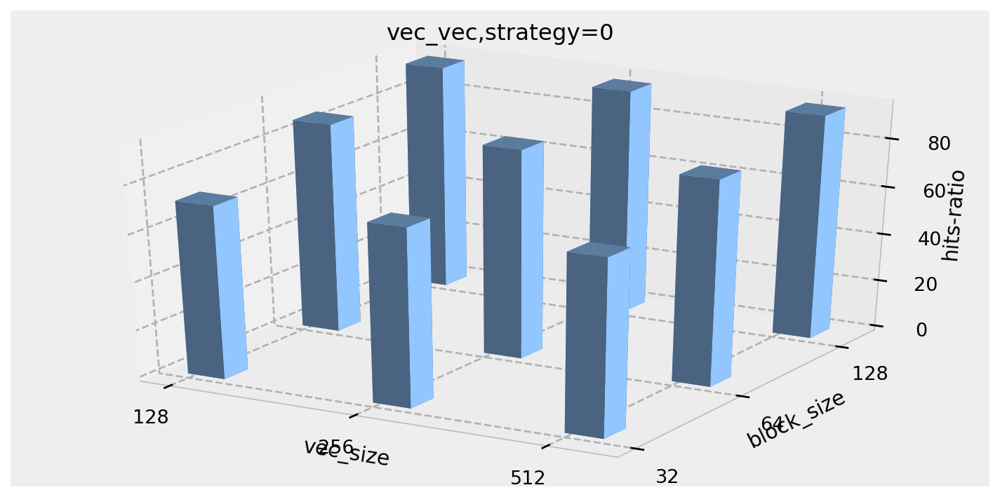

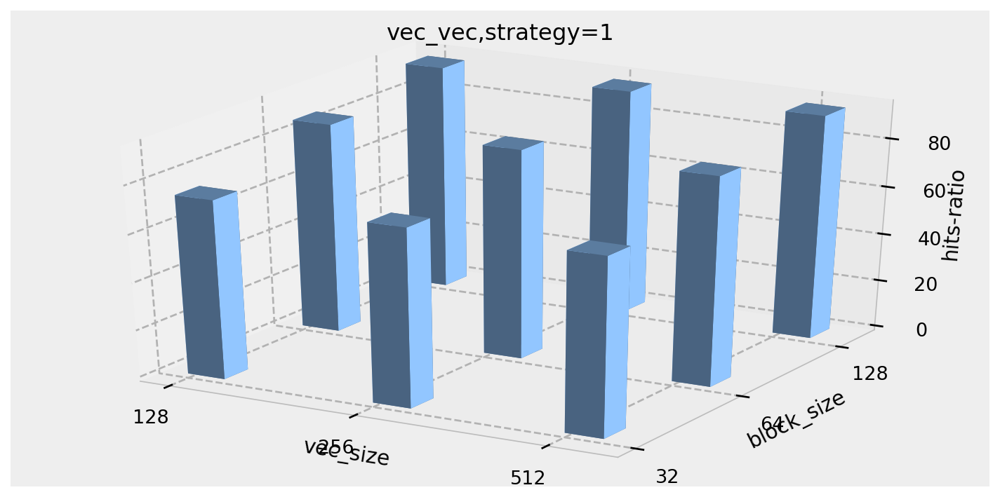

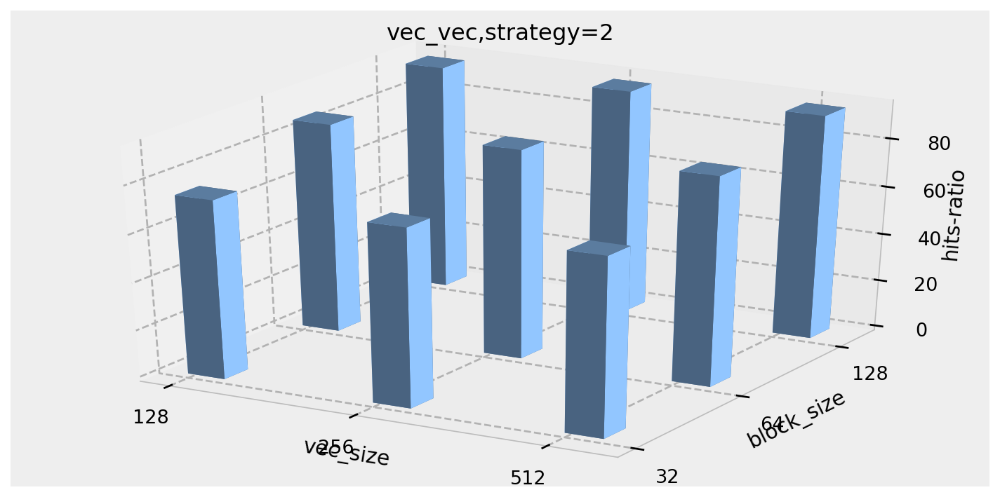

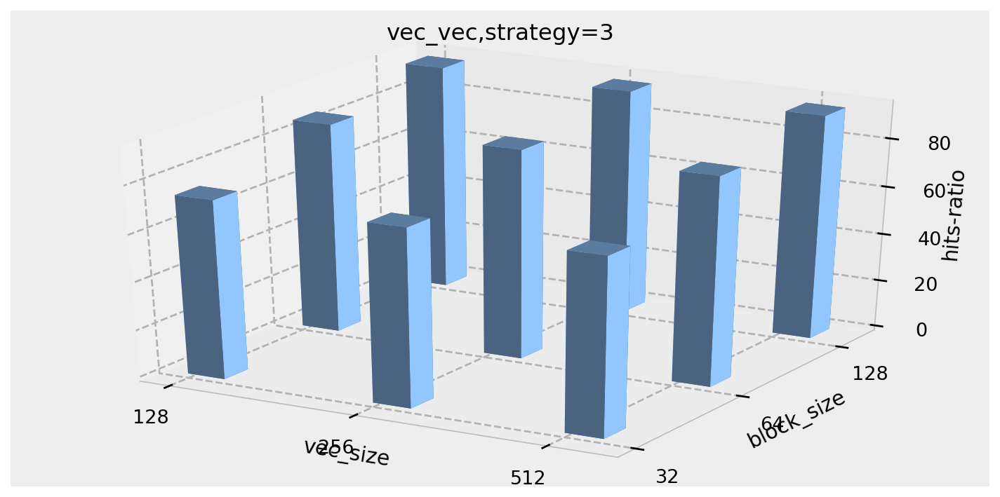

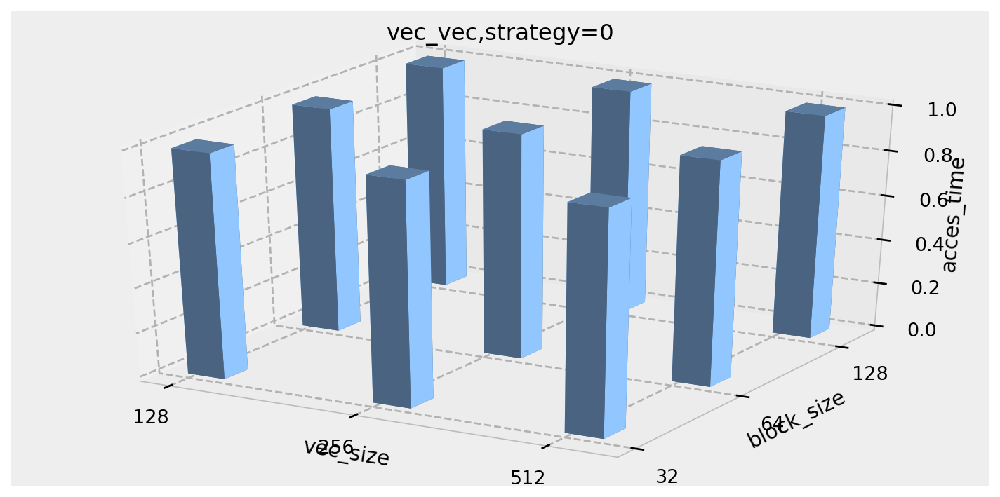

...

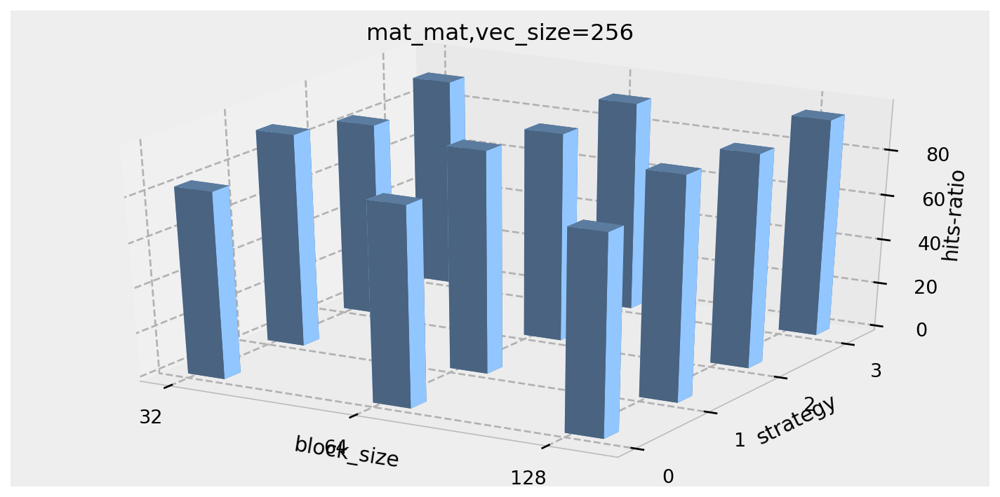

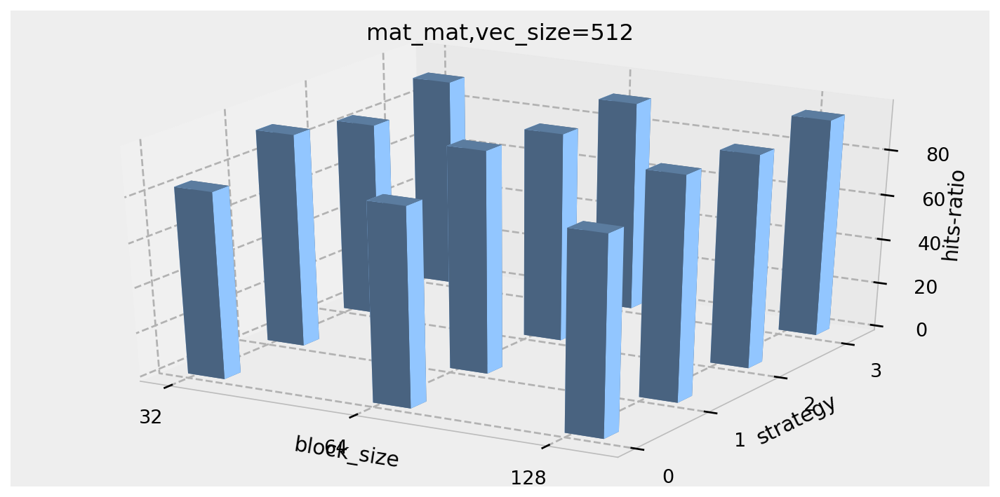

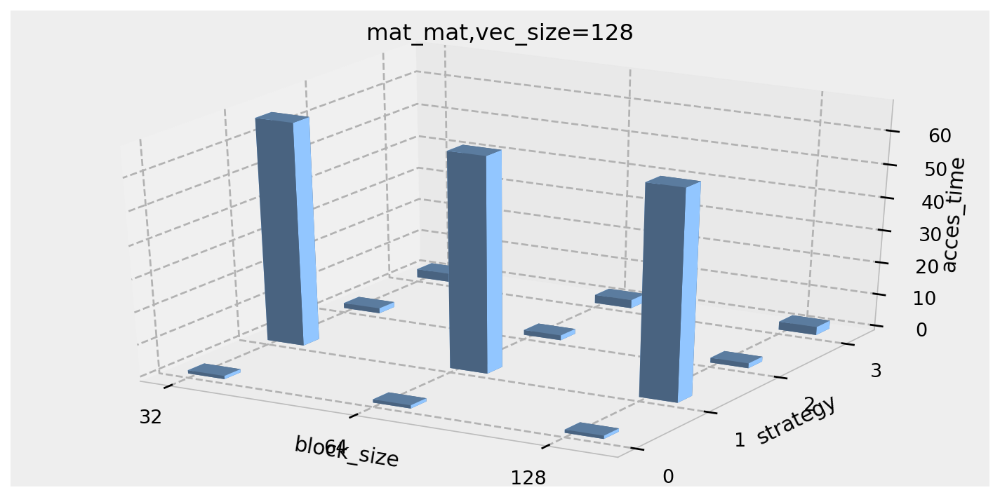

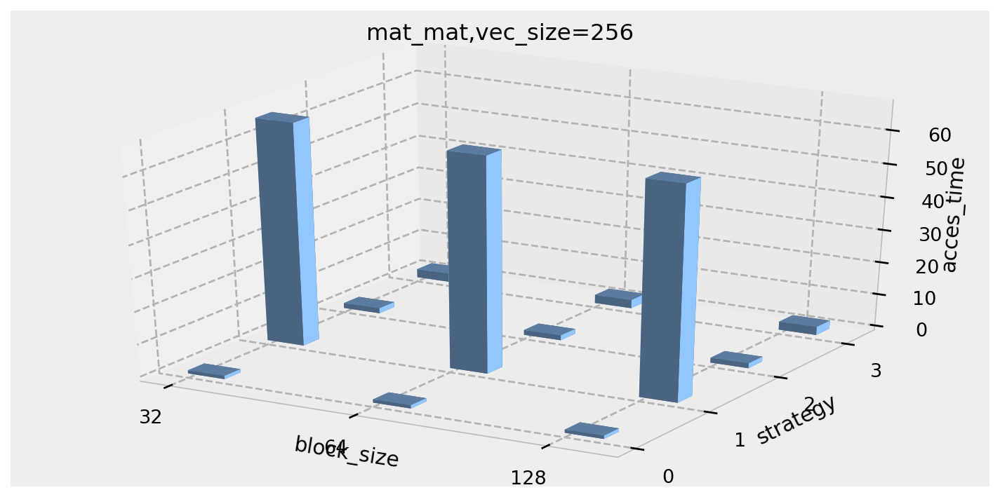

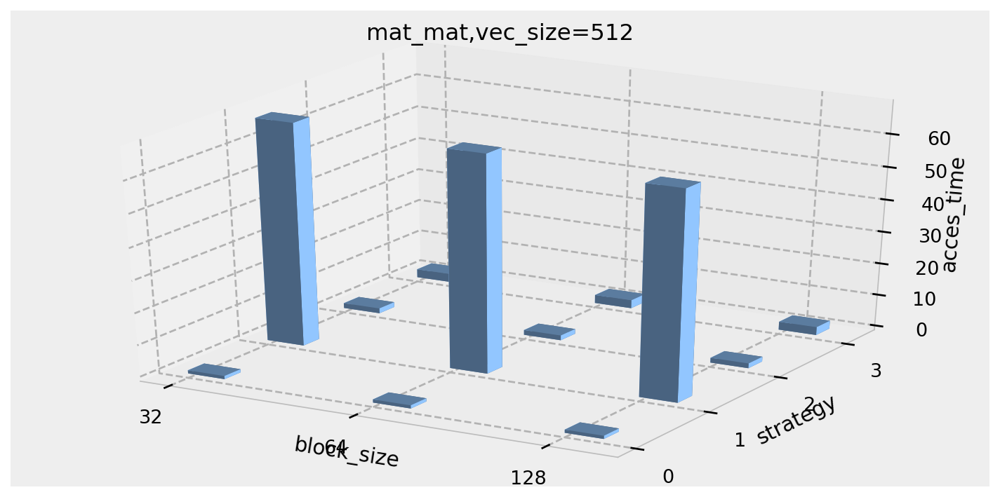

In [117]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from matplotlib import style
style.use('seaborn-talk')
#acces_time     hits  hits-ratio  misses  nbr_block  strategy test_type
figure_input_params = ["vec_size", "block_size","strategy"]
figure_output_params = ["hits-ratio", "acces_time"]
figure_type = ["vec_vec","vec_mat","mat_mat"]
var_label = {"strategy": [[1,2,3,4],[0, 1, 2, 3]],"block_size": [[1,2,3],[32, 64 ,128]],"vec_size": [[1,2,3],[128,256,512]]}
def trans_label(df_colomn, name):
    if name == "strategy":
        df_colomn = df_colomn +1
    elif name == "block_size":
        df_colomn = np.log2(df_colomn) - 4
    elif name == "vec_size":
        df_colomn = np.log2(df_colomn) - 6
    return df_colomn

for m in range(0,3): 
    df_0 = df.loc[df['test_type'] == figure_type[m]]
    print(df_1)
    for i in range(0,2):
        for j in range(i+1,3):
            for t in range(0,2):
                k = 3 - i - j;
                for k_i in range(0, len(var_label[figure_input_params[k]][0])):
                    df_1 = df_0.loc[df_0[figure_input_params[k]] == var_label[figure_input_params[k]][1][k_i]]
                    fig = plt.figure(figsize=(12, 6),dpi = 150)
                    ax1 = fig.add_subplot(111, projection='3d')
                    width = depth = 0.2
                    bottom = np.zeros_like(df_1[figure_output_params[t]])
                    ax1.bar3d(trans_label(df_1[figure_input_params[i]],figure_input_params[i])
                              ,trans_label(df_1[figure_input_params[j]],figure_input_params[j]), bottom, width, depth
                              , df_1[figure_output_params[t]], shade=True)
                    ax1.set_xlabel(figure_input_params[i])
                    ax1.set_xticks(var_label[figure_input_params[i]][0])
                    ax1.set_xticklabels(var_label[figure_input_params[i]][1])
                    ax1.set_yticks(var_label[figure_input_params[j]][0])
                    ax1.set_yticklabels(var_label[figure_input_params[j]][1])
                    ax1.set_ylabel(figure_input_params[j])
                    ax1.set_zlabel(figure_output_params[t])
                    ax1.set_title(figure_type[m] + "," + figure_input_params[k] +"="+ str(var_label[figure_input_params[k]][1][k_i]))
                    plt.savefig("./figures/"+figure_type[m] +"," + figure_output_params[t]+ "," + figure_input_params[k] +"="+ str(var_label[figure_input_params[k]][1][k_i]))